In [61]:
import os, json, random
from pathlib import Path
import numpy as np
import cv2
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torchvision import transforms
from torchvision.models import resnet18, ResNet18_Weights

from sklearn.decomposition import PCA
from sklearn.preprocessing import normalize
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.manifold import TSNE
import joblib
import pandas as pd

# --- Config geral ---
SEED = 42
def set_seed(s=SEED):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s); torch.cuda.manual_seed_all(s)
    torch.backends.cudnn.deterministic = True; torch.backends.cudnn.benchmark = False
set_seed()

ROOT      = Path(".")
UNLAB_DIR = ROOT/"imgs"      # ~4k imagens não rotuladas
DATA_DIR  = ROOT/"dataset"   # rotuladas (opcional para avaliação)
SAVE_DIR  = ROOT/"unsup"
(SAVE_DIR/"embeddings").mkdir(parents=True, exist_ok=True)
(SAVE_DIR/"clustering").mkdir(parents=True, exist_ok=True)
(SAVE_DIR/"figs").mkdir(parents=True, exist_ok=True)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# --- Entrada do encoder ---
MODE = "sobel3"        # "sobel3" | "gray3" | "denoised_sobelG"
KEEP_BOTTOM = 0.60     # mantém só 60% inferiores da imagem (ROI)
TAG = f"{MODE}_roi{int(KEEP_BOTTOM*100)}"

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]
to_tensor = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

CLASSES = ["buracos","rachaduras","boas"]  # usado só se existir dataset/


In [62]:
from functions import preprocess  # deve retornar (denoised_bgr_224, sobel_224)
from pathlib import Path
import numpy as np

def make_rgb_for_backbone(img_bgr, mode=MODE, keep_bottom=KEEP_BOTTOM):
    # 1) ROI ANTES do processamento: corta o topo para reduzir céu/carros
    if keep_bottom is not None:
        h = img_bgr.shape[0]
        top = int(h * (1 - keep_bottom))
        img_bgr = img_bgr[top:, :, :]

    # 2) Agora aplica blur + Sobel + resize 224 (do seu preprocess)
    den_bgr, sobel = preprocess(img_bgr)   # sobel: (224,224) 0..255, den_bgr: (224,224,3) BGR

    if mode == "sobel3":
        s = sobel.astype(np.uint8)
        rgb = np.stack([s, s, s], axis=2)                 # 3 canais de Sobel
    elif mode == "gray3":
        den_rgb = cv2.cvtColor(den_bgr, cv2.COLOR_BGR2RGB)
        g = cv2.cvtColor(den_rgb, cv2.COLOR_RGB2GRAY)
        rgb = np.stack([g, g, g], axis=2)
    elif mode == "denoised_sobelG":
        den_rgb = cv2.cvtColor(den_bgr, cv2.COLOR_BGR2RGB)
        rgb = den_rgb.astype(np.uint8).copy()
        rgb[...,1] = sobel                                 # injeta borda no canal G
    else:
        raise ValueError("MODE inválido")
    return rgb, sobel  # retorna também o sobel para “edge density”

def list_unlabeled_images(base=UNLAB_DIR):
    base = Path(base)
    if not base.exists():
        print(f'[warn] directory not found: {base}')
        return np.array([], dtype=str)
    exts = {'.jpg','.jpeg','.png','.bmp','.tif','.tiff','.webp','.jfif',
            '.JPG','.JPEG','.PNG','.BMP','.TIF','.TIFF','.WEBP','.JFIF'}
    paths = [str(p) for p in base.rglob('*') if p.suffix in exts and p.is_file()]
    return np.array(sorted(paths), dtype=str)

UNLAB_PATHS = list_unlabeled_images(UNLAB_DIR)
print("UNLAB_DIR existe?", UNLAB_DIR.exists())
print("Qtd (recursivo):", len(UNLAB_PATHS))
print("Exemplos:", UNLAB_PATHS[:5])

def show_grid(paths, rows=1, cols=3, title="", cmap=None, outpath=None):
    plt.figure(figsize=(cols*3, rows*3))
    for i, p in enumerate(paths[:rows*cols]):
        img = cv2.imread(p)
        ax = plt.subplot(rows, cols, i+1)
        if img is None:
            ax.set_title("ilegível"); ax.axis("off"); continue
        if cmap is None:
            ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        else:
            ax.imshow(img, cmap=cmap)
        ax.set_title(Path(p).name, fontsize=8); ax.axis("off")
    plt.suptitle(title); plt.tight_layout()
    if outpath: plt.savefig(outpath, dpi=160)
    plt.show()

def show_before_after(paths, rows=3):
    cols = 2
    plt.figure(figsize=(cols*4, rows*3.5))
    for i, p in enumerate(paths[:rows]):
        img = cv2.imread(p)
        if img is None: continue
        rgb_pre, sobel = make_rgb_for_backbone(img)  # já preprocessado / ROI aplicado
        # Antes (original)
        ax1 = plt.subplot(rows, 2, 2*i+1)
        ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title("ANTES"); ax1.axis("off")
        # Depois (Sobel/entrada do encoder)
        ax2 = plt.subplot(rows, 2, 2*i+2)
        if MODE == "sobel3":
            ax2.imshow(sobel, cmap="gray")
        else:
            ax2.imshow(rgb_pre)
        ax2.set_title("DEPOIS (ROI+Sobel)"); ax2.axis("off")
    plt.tight_layout(); plt.show()


UNLAB_DIR existe? True
Qtd (recursivo): 4195
Exemplos: ['imgs\\img_0_lat-19.9853_lon-43.9734_h269.03195709873063_p-45.jpg'
 'imgs\\img_0_lat-19.9853_lon-43.9734_h89.03195709873064_p-45.jpg'
 'imgs\\img_0_lat-23.4571_lon-51.9393_h270_p-45.jpg'
 'imgs\\img_0_lat-23.4571_lon-51.9393_h90_p-45.jpg'
 'imgs\\img_0_lat-23.5873_lon-46.7170_h153.92412663759296_p-45.jpg']


Não rotuladas: 4195


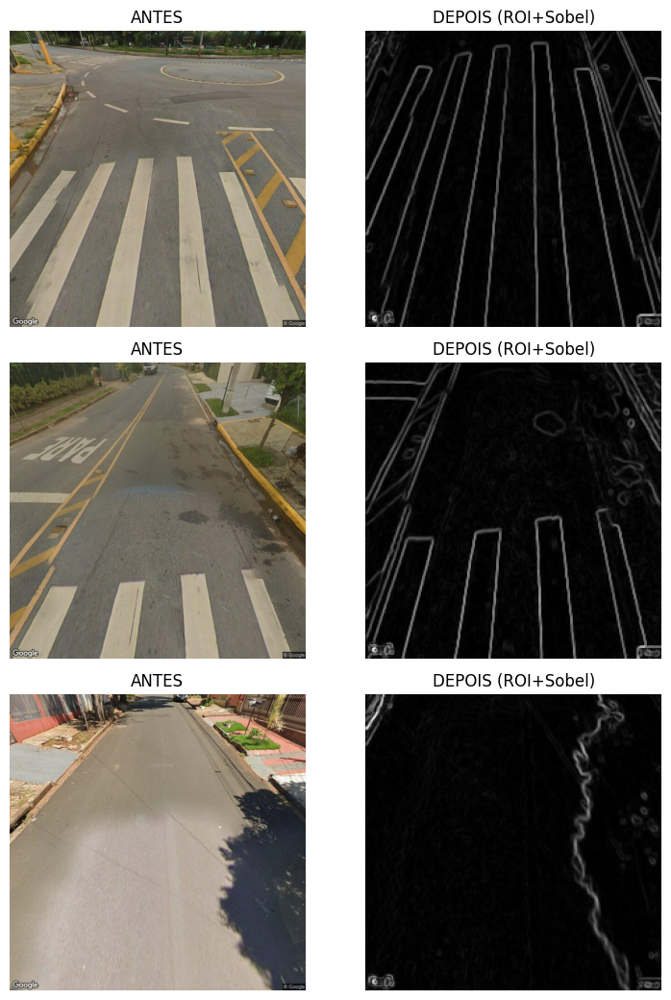

In [63]:
UNLAB_PATHS = list_unlabeled_images(UNLAB_DIR)
print("Não rotuladas:", len(UNLAB_PATHS))
amostras = UNLAB_PATHS[:3] if len(UNLAB_PATHS)>=3 else UNLAB_PATHS
show_before_after(amostras, rows=min(3, len(amostras)))


In [64]:
import numpy as np, cv2
from PIL import Image
import torch, torch.nn as nn
from torchvision.models import resnet18, ResNet18_Weights
from torchvision import transforms
from functions import preprocess  # usa seu blur+Sobel+resize 224

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]
to_tensor = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
])

def imread_any(p):
    # Windows-safe, evita issues de path/encoding
    try:
        data = np.fromfile(p, dtype=np.uint8)
        img = cv2.imdecode(data, cv2.IMREAD_COLOR)
        if img is not None:
            return img
    except Exception:
        pass
    # Fallback: PIL
    try:
        img = Image.open(p).convert('RGB')
        return cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    except Exception:
        return None

class ResNet18Encoder(nn.Module):
    def __init__(self):
        super().__init__()
        m = resnet18(weights=ResNet18_Weights.DEFAULT)
        self.feat = nn.Sequential(*list(m.children())[:-1]).eval()  # (N,512,1,1)
        for p in self.feat.parameters(): p.requires_grad = False
        self.feat.to(DEVICE)

    @torch.no_grad()
    def encode_batch(self, batch_rgb_uint8):
        t = torch.stack([to_tensor(x) for x in batch_rgb_uint8]).to(DEVICE)  # (N,3,224,224)
        f = self.feat(t)             # (N,512,1,1)
        f = torch.flatten(f, 1)      # -> (N,512)
        return f.cpu().numpy().astype(np.float32, copy=False)

encoder = ResNet18Encoder()

def compute_emb_and_edge(paths, batch=64, keep_bottom=KEEP_BOTTOM, mode=MODE, edge_thr=32):
    embs, edges, used = [], [], []
    buf_rgb, buf_edge, buf_paths = [], [], []
    skipped = 0

    def flush():
        if not buf_rgb: return
        feats = encoder.encode_batch(np.stack(buf_rgb, axis=0))
        embs.append(feats)
        edges.append(np.asarray(buf_edge, dtype=np.float32)[:, None])
        used.extend(buf_paths)
        buf_rgb.clear(); buf_edge.clear(); buf_paths.clear()

    for p in paths:
        img = imread_any(p)
        if img is None:
            skipped += 1
            continue

        # ROI antes do preprocess
        if keep_bottom is not None:
            h = img.shape[0]; top = int(h * (1 - keep_bottom))
            if top >= h:    # ROI inválida
                skipped += 1
                continue
            img = img[top:, :, :]

        try:
            den_bgr, sobel = preprocess(img)  # 224x224
        except Exception:
            skipped += 1
            continue

        # Monta a entrada do encoder
        if mode == "sobel3":
            s = sobel.astype(np.uint8)
            rgb224 = np.stack([s, s, s], axis=2)
        elif mode == "gray3":
            den_rgb = cv2.cvtColor(den_bgr, cv2.COLOR_BGR2RGB)
            g = cv2.cvtColor(den_rgb, cv2.COLOR_RGB2GRAY)
            rgb224 = np.stack([g, g, g], axis=2)
        elif mode == "denoised_sobelG":
            den_rgb = cv2.cvtColor(den_bgr, cv2.COLOR_BGR2RGB)
            rgb224 = den_rgb.astype(np.uint8).copy()
            rgb224[...,1] = sobel
        else:
            skipped += 1
            continue

        ed = (sobel > edge_thr).mean()

        buf_rgb.append(rgb224); buf_edge.append(ed); buf_paths.append(p)
        if len(buf_rgb) == batch:
            flush()
    flush()

    emb = np.concatenate(embs, axis=0) if embs else np.zeros((0,512), np.float32)
    edge = np.concatenate(edges, axis=0) if edges else np.zeros((0,1), np.float32)
    used_paths = np.array(used, dtype=str)

    print(f"[compute] total={len(paths)}  ok={emb.shape[0]}  puladas={skipped}")
    return emb, edge, used_paths


In [65]:
EMB_UNLAB_NPY   = SAVE_DIR/"embeddings"/f"unlabeled_resnet18_{TAG}.npy"
ED_UNLAB_NPY    = SAVE_DIR/"embeddings"/f"unlabeled_edensity_{TAG}.npy"
PATHS_UNLAB_NPY = SAVE_DIR/"embeddings"/f"unlabeled_paths_{TAG}.npy"

def load_or_recompute_unlab():
    if EMB_UNLAB_NPY.exists() and ED_UNLAB_NPY.exists() and PATHS_UNLAB_NPY.exists():
        emb = np.load(EMB_UNLAB_NPY); ed = np.load(ED_UNLAB_NPY)
        paths = np.load(PATHS_UNLAB_NPY, allow_pickle=True)
        if emb.shape[0] == 0 or ed.shape[0] == 0:
            # invalida cache vazio
            EMB_UNLAB_NPY.unlink(missing_ok=True)
            ED_UNLAB_NPY.unlink(missing_ok=True)
            PATHS_UNLAB_NPY.unlink(missing_ok=True)
            emb, ed, paths = compute_emb_and_edge(UNLAB_PATHS, batch=64)
            np.save(EMB_UNLAB_NPY, emb); np.save(ED_UNLAB_NPY, ed); np.save(PATHS_UNLAB_NPY, paths)
    else:
        emb, ed, paths = compute_emb_and_edge(UNLAB_PATHS, batch=64)
        np.save(EMB_UNLAB_NPY, emb); np.save(ED_UNLAB_NPY, ed); np.save(PATHS_UNLAB_NPY, paths)
    return emb, ed, paths

emb_unlab, ed_unlab, UNLAB_OK_PATHS = load_or_recompute_unlab()
print("emb_unlab:", emb_unlab.shape, "ed_unlab:", ed_unlab.shape, "ok_paths:", len(UNLAB_OK_PATHS))
assert emb_unlab.shape[0] == ed_unlab.shape[0] == len(UNLAB_OK_PATHS) and emb_unlab.shape[0] > 0, "Nada lido. Verifique extensões/pastas."


emb_unlab: (4195, 512) ed_unlab: (4195, 1) ok_paths: 4195


In [66]:
# PCA para 64D e concat da edge density (peso 3x)
pca = PCA(n_components=64, random_state=SEED)
emb_unlab_64  = pca.fit_transform(emb_unlab)
emb_unlab_feat = np.concatenate([emb_unlab_64, 3.0*ed_unlab], axis=1)
emb_unlab_n    = normalize(emb_unlab_feat, norm="l2")
print("feat:", emb_unlab_feat.shape, "norm:", emb_unlab_n.shape)

# KMeans
kmeans = KMeans(n_clusters=3, n_init=30, random_state=SEED).fit(emb_unlab_n)
unlab_clusters = kmeans.predict(emb_unlab_n)
centroids = kmeans.cluster_centers_
dists = np.linalg.norm(emb_unlab_n - centroids[unlab_clusters], axis=1)

df_unlab = pd.DataFrame({"path": UNLAB_OK_PATHS, "cluster": unlab_clusters, "dist": dists})
print(df_unlab["cluster"].value_counts().sort_index())

# Salva
joblib.dump(kmeans, SAVE_DIR/"clustering"/f"kmeans_k3_{TAG}.pkl")
df_unlab.to_csv(SAVE_DIR/"clustering"/f"labels_unlabeled_{TAG}.csv", index=False)


feat: (4195, 65) norm: (4195, 65)
cluster
0     981
1    1273
2    1941
Name: count, dtype: int64


In [67]:
kmeans = KMeans(n_clusters=3, n_init=30, random_state=SEED).fit(emb_unlab_n)

# rótulo de cluster e "confiança" (distância ao centróide)
unlab_clusters = kmeans.predict(emb_unlab_n)
centroids = kmeans.cluster_centers_
dists = np.linalg.norm(emb_unlab_n - centroids[unlab_clusters], axis=1)

df_unlab = pd.DataFrame({
    "path": UNLAB_OK_PATHS,
    "cluster": unlab_clusters,
    "dist": dists
}).sort_values(["cluster","dist"])

print("Contagem por cluster:\n", df_unlab["cluster"].value_counts().sort_index())

# salvar artefatos
joblib.dump(kmeans, SAVE_DIR/"clustering"/f"kmeans_k3_{TAG}.pkl")
df_unlab.to_csv(SAVE_DIR/"clustering"/f"labels_unlabeled_{TAG}.csv", index=False)
np.save(SAVE_DIR/"clustering"/f"centroids_{TAG}.npy", centroids)


Contagem por cluster:
 cluster
0     981
1    1273
2    1941
Name: count, dtype: int64


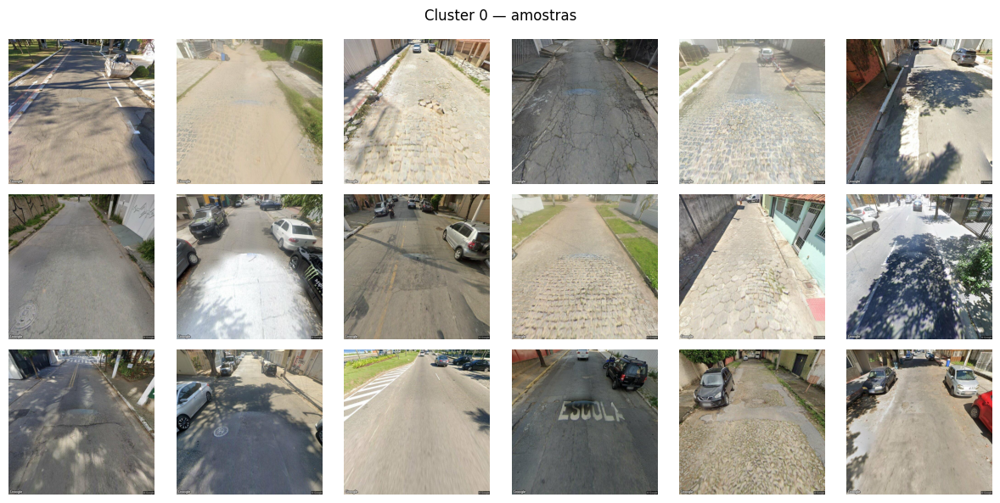

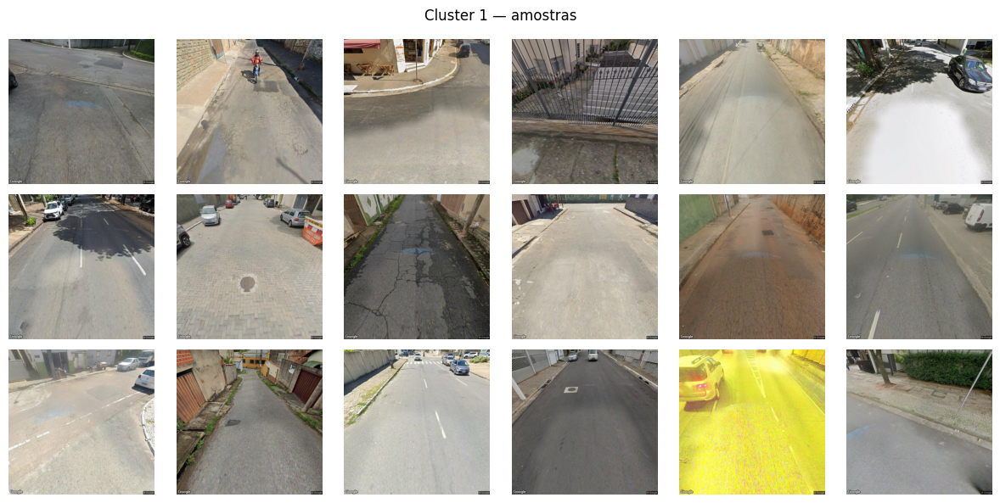

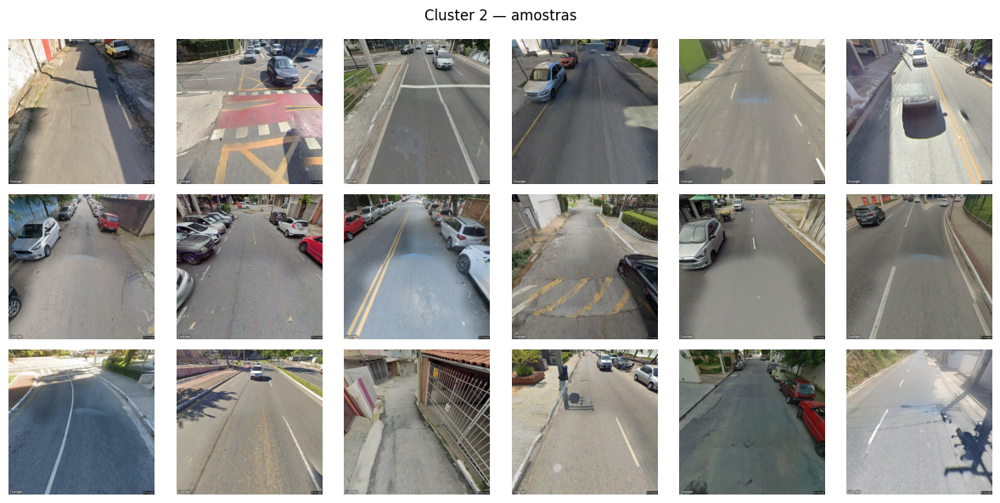

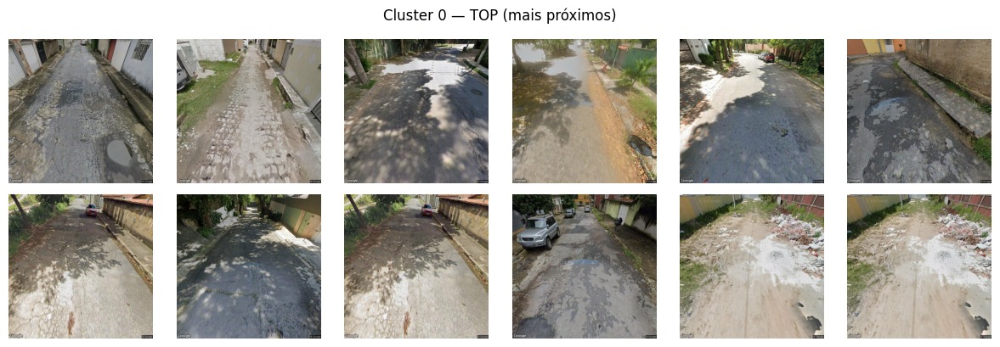

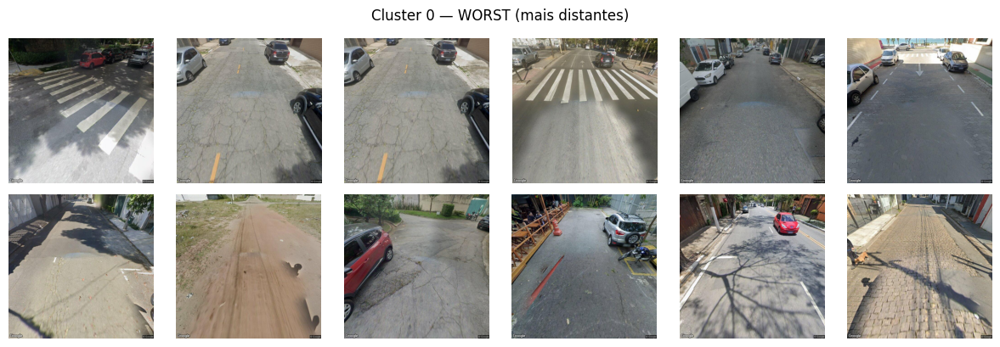

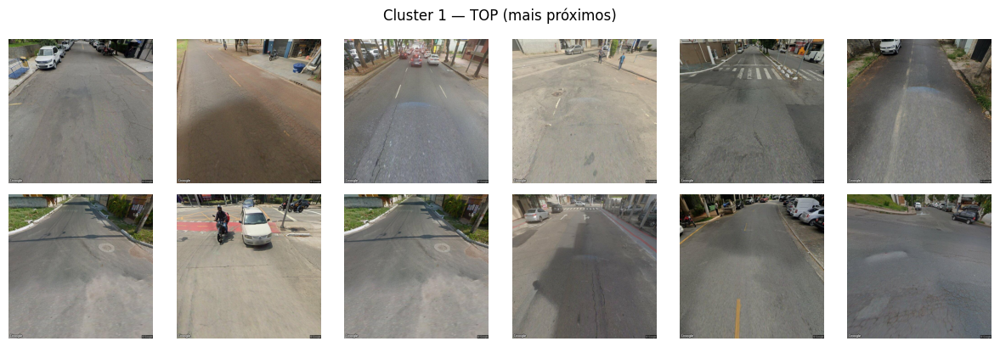

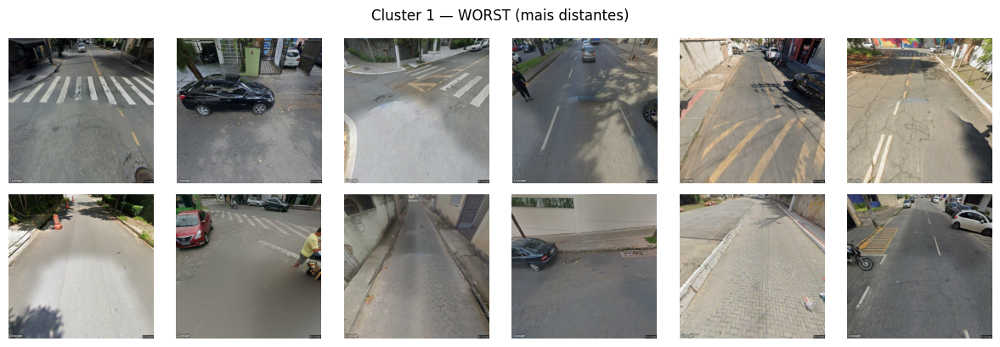

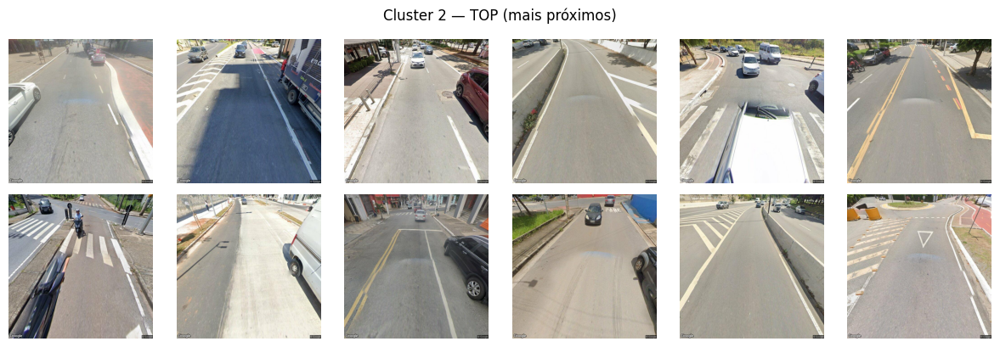

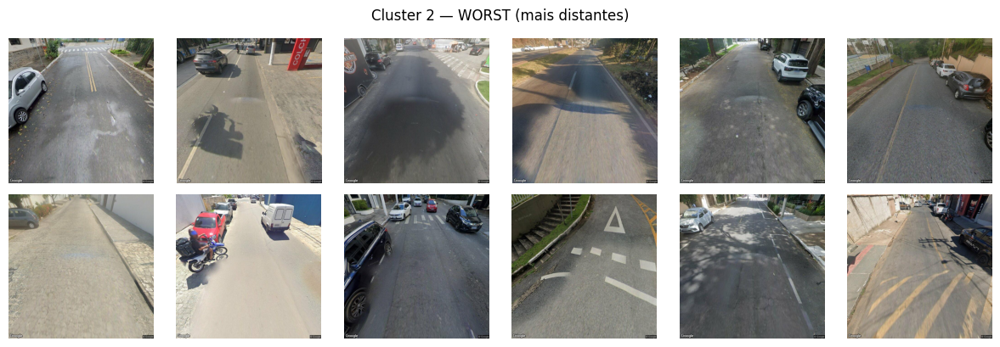

In [68]:
def show_grid_paths(paths, title, rows=3, cols=6, outname=None):
    plt.figure(figsize=(cols*2, rows*2))
    for i, p in enumerate(paths[:rows*cols]):
        img = cv2.imread(p)
        ax = plt.subplot(rows, cols, i+1)
        if img is None: ax.axis("off"); continue
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax.axis("off")
    plt.suptitle(title); plt.tight_layout()
    if outname: plt.savefig(SAVE_DIR/"figs"/outname, dpi=160)
    plt.show()

# 24 exemplos aleatórios por cluster
for c in sorted(df_unlab["cluster"].unique()):
    amostras = df_unlab[df_unlab["cluster"]==c]["path"].sample(
        min(24, (df_unlab["cluster"]==c).sum()), random_state=SEED).tolist()
    show_grid_paths(amostras, title=f"Cluster {c} — amostras", outname=f"samples_cluster{c}_{TAG}.png")

# TOP 12 mais próximos e 12 piores (por cluster)
for c in sorted(df_unlab["cluster"].unique()):
    sub = df_unlab[df_unlab["cluster"]==c]
    top = sub.nsmallest(12, "dist")["path"].tolist()
    worst = sub.nlargest(12, "dist")["path"].tolist()
    show_grid_paths(top,   title=f"Cluster {c} — TOP (mais próximos)",  outname=f"cluster{c}_top_{TAG}.png")
    show_grid_paths(worst, title=f"Cluster {c} — WORST (mais distantes)", outname=f"cluster{c}_worst_{TAG}.png")


In [69]:
def list_labeled_images(base=DATA_DIR):
    paths, labels = [], []
    for y, cls in enumerate(CLASSES):
        p = base/cls
        if not p.exists(): continue
        for f in sorted(p.iterdir()):
            if f.suffix.lower() in (".jpg",".jpeg",".png"):
                paths.append(str(f)); labels.append(y)
    return np.array(paths), np.array(labels, dtype=np.int64)

SPLITS_JSON = ROOT/"runs/ponto3/splits.json"
if DATA_DIR.exists() and SPLITS_JSON.exists():
    LAB_PATHS, LAB_Y = list_labeled_images(DATA_DIR)
    sp = json.load(open(SPLITS_JSON, "r", encoding="utf-8"))
    idx_tr = np.array(sp["train"]); idx_va = np.array(sp["val"]); idx_te = np.array(sp["test"])

    TRVAL_PATHS = LAB_PATHS[np.concatenate([idx_tr, idx_va])]
    TRVAL_Y     = LAB_Y[np.concatenate([idx_tr, idx_va])]
    TEST_PATHS  = LAB_PATHS[idx_te]; TEST_Y = LAB_Y[idx_te]

    # extrai embeddings+edge para trval/test com MESMO pipeline
    EMB_TRVAL_NPY = SAVE_DIR/"embeddings"/f"trainval_resnet18_{TAG}.npy"
    ED_TRVAL_NPY  = SAVE_DIR/"embeddings"/f"trainval_edensity_{TAG}.npy"
    PATHS_TRVAL_NPY = SAVE_DIR/"embeddings"/f"trainval_paths_{TAG}.npy"

    EMB_TEST_NPY = SAVE_DIR/"embeddings"/f"test_resnet18_{TAG}.npy"
    ED_TEST_NPY  = SAVE_DIR/"embeddings"/f"test_edensity_{TAG}.npy"
    PATHS_TEST_NPY = SAVE_DIR/"embeddings"/f"test_paths_{TAG}.npy"

    if EMB_TRVAL_NPY.exists() and ED_TRVAL_NPY.exists() and PATHS_TRVAL_NPY.exists():
        emb_trval = np.load(EMB_TRVAL_NPY); ed_trval = np.load(ED_TRVAL_NPY)
        TRVAL_OK_PATHS = np.load(PATHS_TRVAL_NPY, allow_pickle=True)
    else:
        emb_trval, ed_trval, TRVAL_OK_PATHS = compute_emb_and_edge(TRVAL_PATHS)
        np.save(EMB_TRVAL_NPY, emb_trval); np.save(ED_TRVAL_NPY, ed_trval)
        np.save(PATHS_TRVAL_NPY, TRVAL_OK_PATHS)

    if EMB_TEST_NPY.exists() and ED_TEST_NPY.exists() and PATHS_TEST_NPY.exists():
        emb_test = np.load(EMB_TEST_NPY); ed_test = np.load(ED_TEST_NPY)
        TEST_OK_PATHS = np.load(PATHS_TEST_NPY, allow_pickle=True)
    else:
        emb_test, ed_test, TEST_OK_PATHS = compute_emb_and_edge(TEST_PATHS)
        np.save(EMB_TEST_NPY, emb_test); np.save(ED_TEST_NPY, ed_test)
        np.save(PATHS_TEST_NPY, TEST_OK_PATHS)

    # PCA treinado nas NÃO rotuladas → transforma trval/test
    emb_trval_64 = pca.transform(emb_trval)
    emb_test_64  = pca.transform(emb_test)

    emb_trval_feat = np.concatenate([emb_trval_64, 3.0*ed_trval], axis=1)
    emb_test_feat  = np.concatenate([emb_test_64,  3.0*ed_test ], axis=1)

    emb_trval_n = normalize(emb_trval_feat, norm="l2")
    emb_test_n  = normalize(emb_test_feat,  norm="l2")

    # mapping cluster->classe por maioria em train+val
    cl_trval = kmeans.predict(emb_trval_n)
    mapping = {}
    for c in range(3):
        idx = np.where(cl_trval==c)[0]
        if len(idx)==0: mapping[c] = int(np.argmax(np.bincount(TRVAL_Y)))
        else:           mapping[c] = int(np.argmax(np.bincount(TRVAL_Y[idx])))

    # avaliação no TESTE
    cl_test = kmeans.predict(emb_test_n)
    y_pred  = np.array([mapping[c] for c in cl_test], dtype=np.int64)
    acc = accuracy_score(TEST_Y, y_pred)
    cm  = confusion_matrix(TEST_Y, y_pred, labels=[0,1,2])

    print("Mapping (cluster -> classe):", mapping)
    print("Acurácia (teste):", f"{acc:.3f}")
    print("Matriz de confusão:\n", cm)

    # salvar
    np.save(SAVE_DIR/"clustering"/f"cm_kmeans_{TAG}.npy", cm)
    json.dump({"test_acc": float(acc), "mapping": mapping, "tag": TAG},
              open(SAVE_DIR/"clustering"/f"metrics_kmeans_{TAG}.json","w"), indent=2)

    # heatmap simples (opcional)
    try:
        import seaborn as sns
        plt.figure(figsize=(4,3))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                    xticklabels=CLASSES, yticklabels=CLASSES)
        plt.xlabel("Predito"); plt.ylabel("Verdadeiro"); plt.title(f"CM (teste) — {TAG}")
        plt.tight_layout(); plt.savefig(SAVE_DIR/"figs"/f"cm_test_{TAG}.png", dpi=160); plt.show()
    except Exception as e:
        print("Heatmap pulado (seaborn opcional):", e)
else:
    print("Sem avaliação supervisionada: `dataset/` ou `runs/ponto3/splits.json` não encontrados.")


Mapping (cluster -> classe): {0: 0, 1: 1, 2: 2}
Acurácia (teste): 0.542
Matriz de confusão:
 [[42  6  1]
 [33 19 10]
 [ 3 17 22]]
Heatmap pulado (seaborn opcional): No module named 'seaborn'


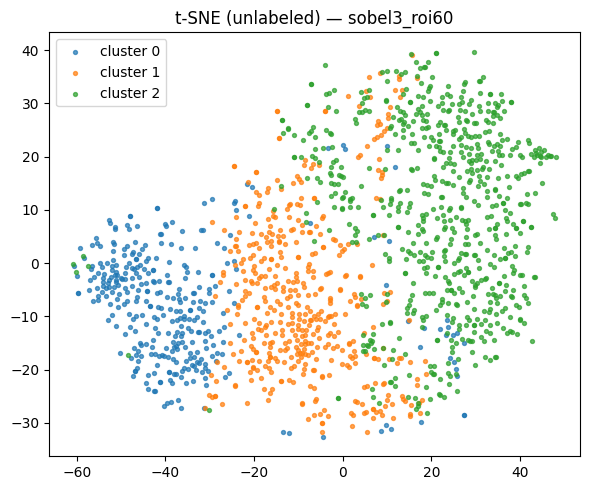

In [70]:
# t-SNE das NÃO rotuladas por cluster (cuidado: pode demorar)
subset = min(1500, emb_unlab_n.shape[0])
idx = np.random.RandomState(SEED).choice(emb_unlab_n.shape[0], size=subset, replace=False)
X2 = TSNE(n_components=2, random_state=SEED, perplexity=30, init="pca").fit_transform(emb_unlab_n[idx])

plt.figure(figsize=(6,5))
for c in sorted(np.unique(unlab_clusters[idx])):
    mask = (unlab_clusters[idx]==c)
    plt.scatter(X2[mask,0], X2[mask,1], s=8, label=f"cluster {c}", alpha=0.7)
plt.legend(); plt.title(f"t-SNE (unlabeled) — {TAG}")
plt.tight_layout(); plt.savefig(SAVE_DIR/"figs"/f"tsne_unlab_{TAG}.png", dpi=160); plt.show()
